# End-to-end multi-class dog breed classification
Multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem
Identyfying breed of a dog given an image.

## 2. Data
The data is from Kaggle.

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

## 4. Features
Some information about the data:
* We're dealing with images (unstructured data), so it will be probably best to use deep learning/transfer learning.
* There are 120 breeds of dogs, so there are 120 different classes.
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (no labels).

In [ ]:
!unzip -o "/content/drive/MyDrive/DogVision/dog-breed-identification.zip" -d "/content/drive/MyDrive/DogVision"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/DogVision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/DogVision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/MyDrive/Dog

### Getting workspace ready
* Import TF 2.0
* Import TF Hub
* Make sure we're using GPU

In [ ]:
import tensorflow as tf
print("TF version:", tf.__version__)

TF version: 2.15.0


In [ ]:
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

TF Hub version: 0.15.0


In [ ]:
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Getting our data ready - turning it into Tensors

In [ ]:
# Checkout the labels
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/DogVision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

<Axes: >

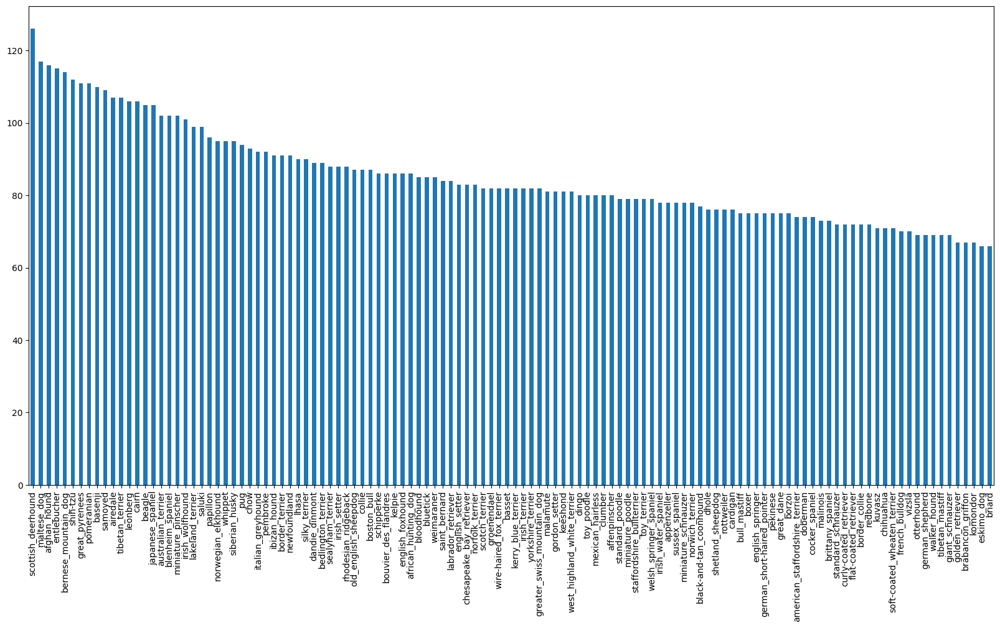

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

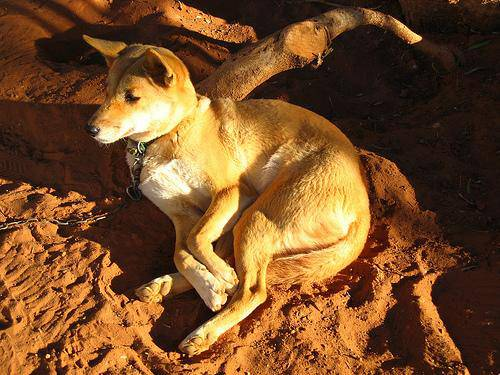

In [ ]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames.

In [ ]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/DogVision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
len(filenames)

10222

In [ ]:
# Check whether number of filenames matches number of image files
import os
if len(os.listdir("/content/drive/MyDrive/DogVision/train/")) == len(filenames):
  print("match")
else:
  print("do not match")

match


In [ ]:
len(os.listdir("/content/drive/MyDrive/DogVision/train/"))

10222

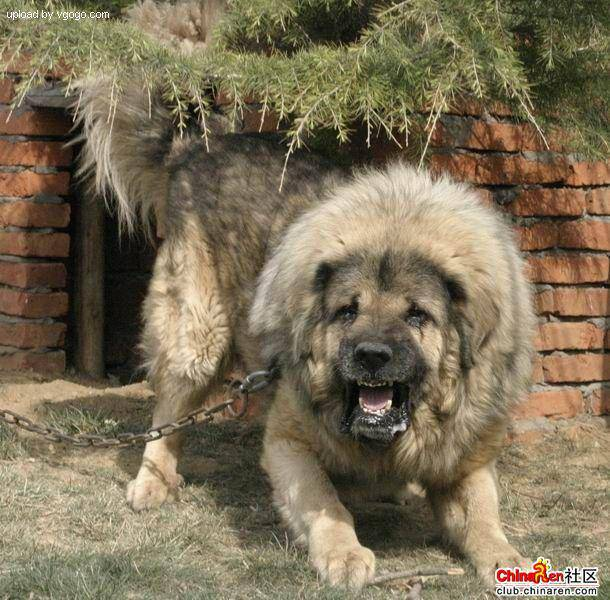

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

We have our training image filepaths. Let's prepare the labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches number of filenames
if len(labels) == len(filenames):
  print("succeed")
else:
  print("failed")

succeed


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there should be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into train and validation sets of total size of NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/DogVision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/DogVision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/DogVision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/DogVision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/DogVision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, Fa

## Preprocessing images (turning them into Tensors)
We're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Resize the `image` to be a shape of (224, 224)
5. Return the modified `image`

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

def process_image(image_path, img_size=IMG_SIZE):
  """
  Turns an image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (R, G, B)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (normalize the image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

## Turning data into batches
We do about 32 (batch size) images at a time because processing 10,000+ images in one go might be too much for memory.

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.

In [ ]:
# Create a function to return a tuple of Tensors (image, label)
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

Now we've got a way to turn our data into tuples of Tensors, let's make a function to turn all of our data (`X` & `y`) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as an input (no labels).
  """
  # If test data, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths, no labels
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch
  #If validation dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))
    # Create (image, label) tuples and turn the image path into a preprocessed image as above
    data = data.map(get_image_label)
    data_batch = data.batch(batch_size)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Checkout attributes of data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  plt.figure(figsize=(10, 10))
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

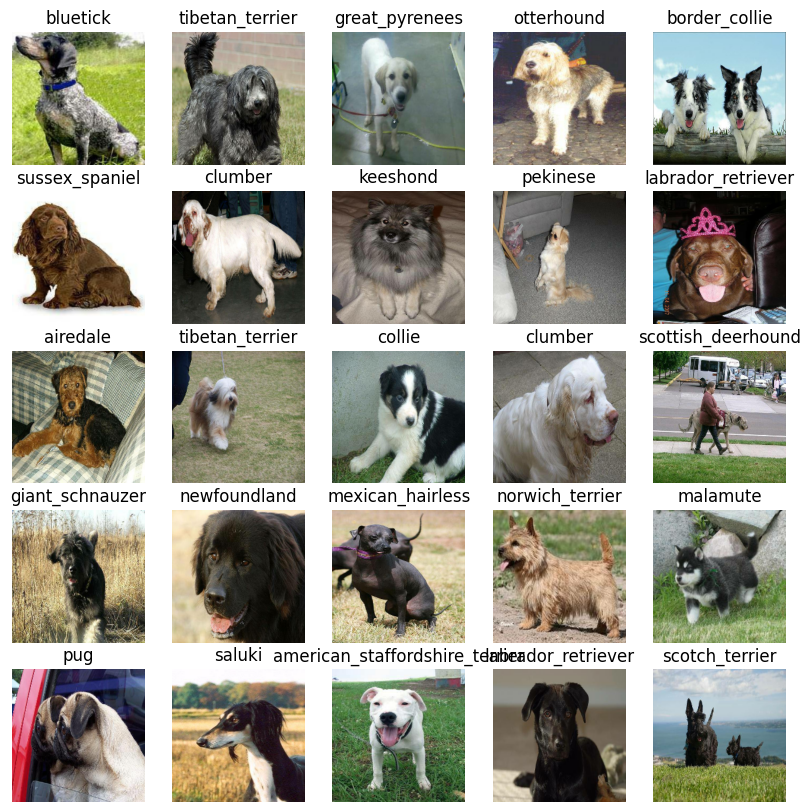

In [ ]:
show_25_images(train_images, train_labels)

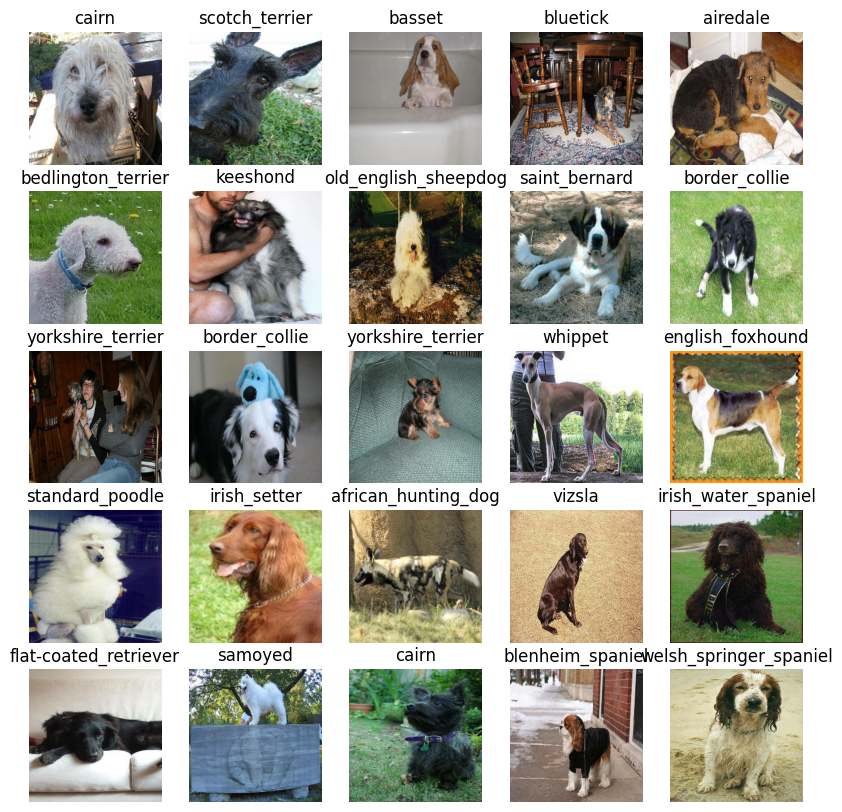

In [ ]:
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before building a model, we need to define:
* The input shape (images shape in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use.

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2"

In [ ]:
# What's the difference between sequential and functional Keras?

Now let's build a Keras deep learning model.
We'll create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this, then this, then that).
* Compiles the model (says how it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(model_url), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=output_shape,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.legacy.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(input_shape)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Create callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.
We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard callback
To set it up, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to out model's `fit()` function.
3. Visualize our model's training logs with the `%tensorboard` magic function (we'll do this after model training).

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/DogVision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback
It helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model on subset of data
The first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
# Check if we're still running on a GPU
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.
* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [ ]:
def train_model():
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])

  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2
Epoch 1/100
25/25 [==============================] - 347s 14s/step - loss: 4.3924 - accuracy: 0.1075 - val_loss: 3.3127 - val_accuracy: 0.2900
Epoch 2/100
25/25 [==============================] - 2s 97ms/step - loss: 1.5575 - accuracy: 0.7063 - val_loss: 2.1226 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 145ms/step - loss: 0.5524 - accuracy: 0.9337 - val_loss: 1.6117 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 3s 124ms/step - loss: 0.2499 - accuracy: 0.9825 - val_loss: 1.4687 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 2s 98ms/step - loss: 0.1475 - accuracy: 0.9962 - val_loss: 1.3916 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 2s 91ms/step - loss: 0.0997 - accuracy: 0.9987 - val_loss: 1.3409 - val_accuracy: 0.6350
Epoch 

**Question:** Model is probably overfitting because it's performing far better on the training dataset than the validation dataset. What are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing because it means our model is learning.

### Checking the TensorBoard logs
The TensorBoard magic function (`%tensorboard`) will access the logs directory and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/DogVision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 78ms/step


array([[7.2958908e-04, 4.5692606e-05, 1.5483821e-04, ..., 5.7360472e-04,
        1.3136354e-04, 4.3653175e-03],
       [6.2501058e-04, 1.2527361e-03, 4.3935541e-02, ..., 1.6944718e-03,
        3.2083611e-03, 3.6126364e-04],
       [4.4280246e-06, 1.9728196e-04, 7.7719102e-05, ..., 7.4889918e-05,
        1.6943937e-04, 3.9426599e-05],
       ...,
       [1.6325404e-05, 3.5116906e-04, 1.2766159e-04, ..., 5.8868194e-05,
        4.7367244e-04, 2.7615990e-04],
       [1.0245507e-02, 4.2277694e-04, 3.0205245e-05, ..., 4.3011858e-04,
        8.7156135e-05, 4.2312806e-03],
       [9.9765821e-05, 2.8258304e-05, 2.4238578e-04, ..., 5.8113090e-03,
        7.4118248e-04, 1.1127783e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[7.2958908e-04 4.5692606e-05 1.5483821e-04 8.8374931e-05 7.2300655e-04
 8.2471015e-05 3.5002080e-03 6.1165687e-04 3.8349986e-05 3.0329747e-03
 2.5748510e-05 8.9353751e-05 1.3024137e-04 6.4058921e-05 2.5390231e-04
 1.9465516e-04 3.7278958e-05 2.3888716e-01 9.8402561e-06 8.9419045e-05
 7.3759392e-04 1.5718643e-04 1.4128919e-05 4.0744044e-04 8.1183825e-05
 5.4708176e-04 9.1210514e-02 8.4443665e-05 5.7376333e-04 1.9803032e-04
 5.1896190e-05 4.8546449e-04 1.7599940e-04 2.5295461e-05 1.1047350e-04
 8.2984231e-02 8.5975544e-06 4.2023935e-04 4.6052384e-05 3.6840887e-05
 1.4371867e-03 1.0752818e-05 3.2049156e-05 9.3736771e-06 4.3153632e-05
 2.3094412e-04 1.4312901e-05 5.8434267e-05 2.5774087e-04 4.6152145e-05
 4.5942059e-05 7.9580030e-05 3.6635032e-04 1.4625247e-04 6.0790131e-05
 4.0426043e-05 1.2553364e-04 2.2236563e-03 2.1962362e-04 3.3320099e-01
 3.0166743e-04 1.6549035e-05 1.0651210e-03 2.3562859e-05 1.7682799e-04
 7.4472055e-03 1.0526839e-04 4.4086608e-04 3.9566653e-03 7.6213735e-05
 2.203

Above functionality is good but we want to be able to do it at scale.
Would be even better if we could see the image the prediction is being made on.

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_label(predictions[2])
pred_label

NameError: ignored

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
images_ = []
labels_ = []

# Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

KeyboardInterrupt: ignored

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

KeyboardInterrupt: ignored

In [ ]:
get_pred_label(val_labels[0])

'cairn'

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make it more visual. We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer.
* Converts the prediction probabilities to a prediction label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  # Change title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

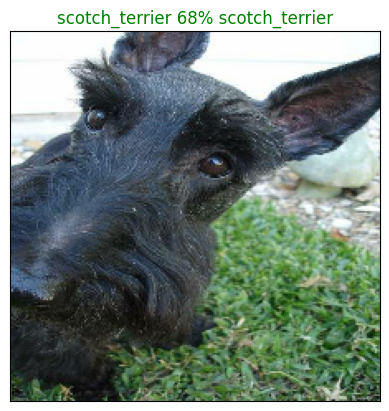

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images)

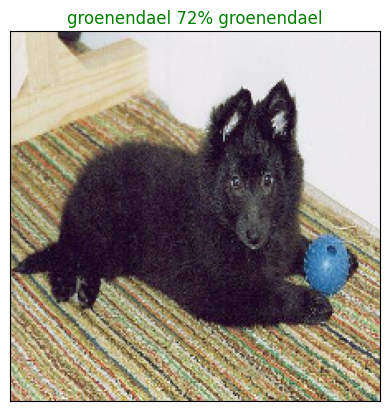

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Let's make a function to visualize model's top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction probabilities indexes
  * Prediction probabilities values
  * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

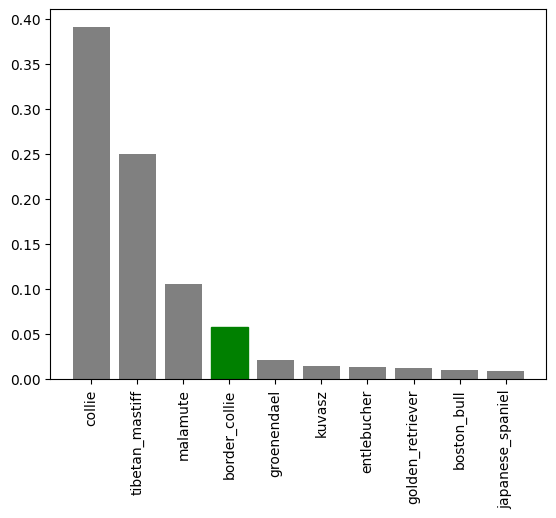

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

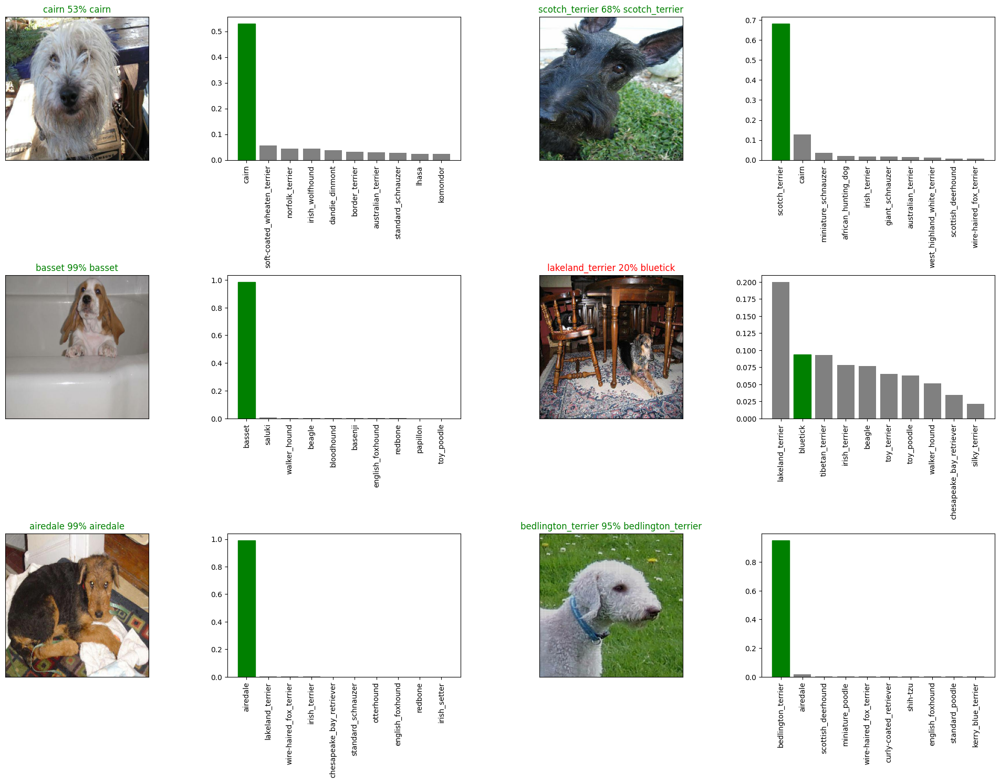

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

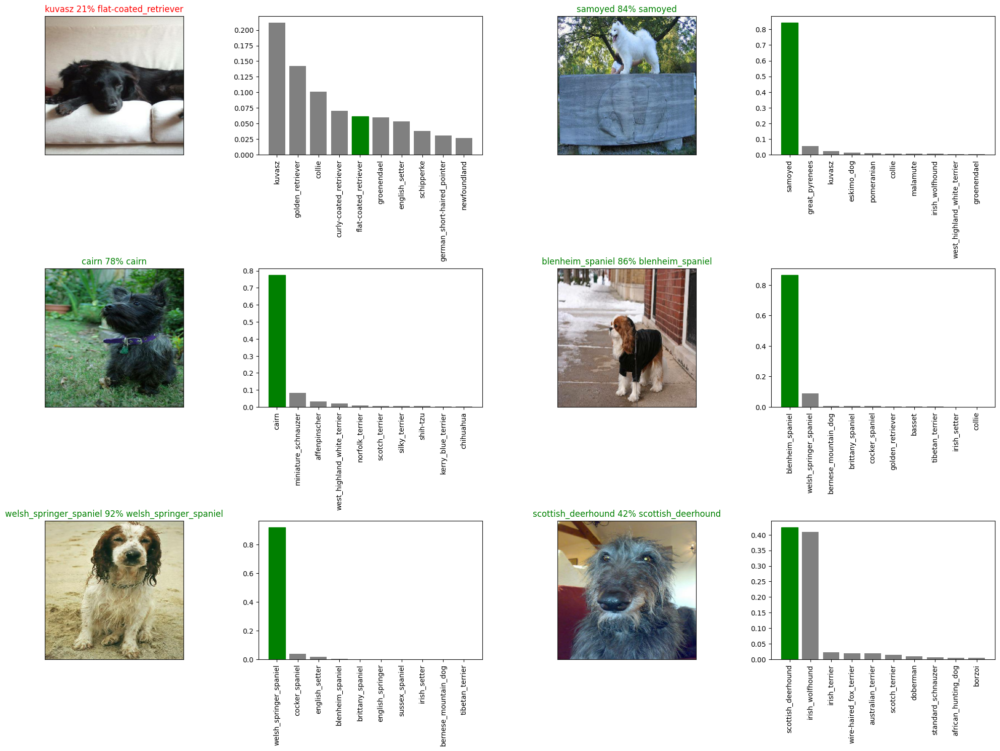

In [ ]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Question:** How to make a confusion matrix with this model's predictions and true labels?

## Saving and reloading a trained model

In [ ]:
def save_model(model, suffix=None):
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/DogVision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"Loading saved model from {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Save model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/DogVision/models/20231228-15431703778185-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/DogVision/models/20231228-15431703778185-1000-images-mobilenetv2-Adam.h5'

In [ ]:
loaded_1000_images_model = load_model("/content/drive/MyDrive/DogVision/models/20231228-00531703724828-1000-images-mobilenetv2-Adam.h5")

Loading saved model from /content/drive/MyDrive/DogVision/models/20231228-00531703724828-1000-images-mobilenetv2-Adam.h5...


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 71ms/step - loss: 1.2315 - accuracy: 0.6600


[1.231452226638794, 0.6600000262260437]

In [ ]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 1s 71ms/step - loss: 1.2700 - accuracy: 0.6600


[1.2700082063674927, 0.6600000262260437]

## Training a big dog model on the full data

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/MyDrive/DogVision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/DogVision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/DogVision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/DogVision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/DogVision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/DogVision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/DogVision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/DogVision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/DogVision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/DogVision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full data
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/2


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on full data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note:** The cell below will take some time.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 3469s 11s/step - loss: 1.3218 - accuracy: 0.6767
Epoch 2/100
320/320 [==============================] - 28s 88ms/step - loss: 0.4005 - accuracy: 0.8806
Epoch 3/100
320/320 [==============================] - 27s 84ms/step - loss: 0.2374 - accuracy: 0.9349
Epoch 4/100
320/320 [==============================] - 27s 82ms/step - loss: 0.1532 - accuracy: 0.9618
Epoch 5/100
320/320 [==============================] - 28s 88ms/step - loss: 0.1069 - accuracy: 0.9773
Epoch 6/100
320/320 [==============================] - 28s 87ms/step - loss: 0.0766 - accuracy: 0.9870
Epoch 7/100
320/320 [==============================] - 28s 87ms/step - loss: 0.0589 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 31s 97ms/step - loss: 0.0478 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 27s 83ms/step - loss: 0.0375 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 28s 86ms/step - 

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to /content/drive/MyDrive/DogVision/models/20231228-16591703782774-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/DogVision/models/20231228-16591703782774-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/DogVision/models/20231228-02191703729949-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from /content/drive/MyDrive/DogVision/models/20231228-02191703729949-full-image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get in into the same format.

To make predictions, we will:
* Get the test images filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` since the test data doesn't have labels.
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "/content/drive/MyDrive/DogVision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/DogVision/test/e7be7b911a4cba9fdfa4105ec4776370.jpg',
 '/content/drive/MyDrive/DogVision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 '/content/drive/MyDrive/DogVision/test/e7dc8cc599049ea9fa2a172c88646c57.jpg',
 '/content/drive/MyDrive/DogVision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 '/content/drive/MyDrive/DogVision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 '/content/drive/MyDrive/DogVision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 '/content/drive/MyDrive/DogVision/test/e7f95aabf775a636b3893ffa120adaf9.jpg',
 '/content/drive/MyDrive/DogVision/test/e7ed96b272013c6de9505a753816ce75.jpg',
 '/content/drive/MyDrive/DogVision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg',
 '/content/drive/MyDrive/DogVision/test/e800b6c8d2904e205d67ada800907762.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Warning: long time to run
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 233s 678ms/step


In [ ]:
# Save predictions (NumPy array) to a csv file (for access later)
np.savetxt("/content/drive/MyDrive/DogVision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (NumPy array) from csv file
# test_predictions = np.loadtxt("/content/drive/MyDrive/DogVision/preds_array.csv", delimiter=",")

In [ ]:
test_predictions[:10]

array([[5.52698111e-07, 3.55174029e-06, 1.49751187e-07, ...,
        1.60582613e-06, 2.02626871e-09, 2.68593453e-07],
       [3.14371462e-08, 1.49300624e-11, 8.43828388e-07, ...,
        1.35091272e-10, 9.22276699e-10, 3.56029318e-07],
       [4.35055370e-07, 2.98295988e-09, 2.00825667e-09, ...,
        3.29348077e-10, 2.23037631e-07, 4.01858635e-08],
       ...,
       [2.58497685e-08, 6.05001715e-10, 4.14488832e-10, ...,
        8.54878043e-11, 1.02201945e-07, 9.86036961e-04],
       [1.32608974e-07, 2.01669172e-05, 6.33017416e-09, ...,
        1.18655912e-08, 2.43241924e-08, 7.23327248e-05],
       [1.94329067e-10, 6.39717576e-12, 3.72469500e-10, ...,
        1.79667113e-04, 1.44557305e-07, 4.02502467e-12]], dtype=float32)

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle
Kaggle wants our model's prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

We'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle

In [ ]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path

'/content/drive/MyDrive/DogVision/test/'

In [ ]:
os.path.splitext(test_filenames[0])

('/content/drive/MyDrive/DogVision/test/e7be7b911a4cba9fdfa4105ec4776370',
 '.jpg')

In [ ]:
os.path.splitext(test_filenames[0])[0]

'/content/drive/MyDrive/DogVision/test/e7be7b911a4cba9fdfa4105ec4776370'

In [ ]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['e7be7b911a4cba9fdfa4105ec4776370',
 'e7ce78e874945f182a4f5149aa505b09',
 'e7dc8cc599049ea9fa2a172c88646c57',
 'e7e9624f2a2e61ab187358f5968bfde8',
 'e7e9dd51302fe08c1c89a550e183cf07',
 'e7fcdf9671a6593b638cbee42842f981',
 'e7f95aabf775a636b3893ffa120adaf9',
 'e7ed96b272013c6de9505a753816ce75',
 'e7feb64da6aae1ef8e62453f6660d0c5',
 'e800b6c8d2904e205d67ada800907762',
 'e806fbb5ca4dd3a094f7819bd810cc65',
 'e806a67a05289ac6de6831001664b81b',
 'e807c4b5025b0aa4dcbd5df2765aa8e4',
 'e816f0027a2c6348dbf12b79c70541bc',
 'e8232c9a79f0e77e9b4c5fca60682d41',
 'e826c0ae5dd27876781c10e1be444fd5',
 'e823ee1ca007c88600806925a6f2bce1',
 'e83f4c0ff6dec86d89d0f8b70ecd3cea',
 'e8319b1410a984291d71a3e60c84d86c',
 'e83d7fa8fdfba0ec577f9c8df811d439',
 'e83fec66a32873298df9fa5fdac113aa',
 'e8505566fd9116b812e306ca196b62da',
 'e850770a6575a34b1c7ad4b401692553',
 'e85291fc6ba44e39defc7769fa020646',
 'e857866af777793d2c114b09ea7a685a',
 'e85b19a69be67eaef9fe58b7e689ee81',
 'e85d4e2707683df0e6387e19b67b873d',
 

In [ ]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7dc8cc599049ea9fa2a172c88646c57,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7be7b911a4cba9fdfa4105ec4776370,5.526981e-07,3.551740e-06,1.497512e-07,1.758927e-07,3.421559e-10,2.641367e-09,2.738948e-10,6.306913e-09,9.793555e-10,...,2.663780e-09,1.226073e-11,7.344004e-11,8.355844e-09,6.782707e-11,1.311299e-10,2.383669e-09,1.605826e-06,2.026269e-09,2.685935e-07
1,e7ce78e874945f182a4f5149aa505b09,3.143715e-08,1.493006e-11,8.438284e-07,4.382302e-14,4.227672e-10,1.545502e-08,7.225793e-09,3.192701e-09,1.826543e-11,...,4.181085e-08,1.070343e-09,3.055721e-09,3.556571e-12,3.208152e-09,7.695166e-12,2.504322e-09,1.350913e-10,9.222767e-10,3.560293e-07
2,e7dc8cc599049ea9fa2a172c88646c57,4.350554e-07,2.982960e-09,2.008257e-09,3.142787e-10,7.500093e-08,6.249753e-09,1.315393e-09,4.542124e-09,4.892062e-12,...,3.744113e-08,3.497452e-09,1.948085e-09,1.338416e-08,2.247087e-09,2.852398e-09,7.454610e-07,3.293481e-10,2.230376e-07,4.018586e-08
3,e7e9624f2a2e61ab187358f5968bfde8,1.061392e-08,1.554887e-10,8.762321e-09,7.588155e-11,3.729017e-08,3.361101e-08,5.695050e-11,2.987242e-08,4.011164e-08,...,1.716401e-08,7.045706e-09,1.257150e-08,1.039966e-08,4.919068e-10,7.860249e-07,2.208215e-08,2.524559e-09,3.384715e-09,3.825019e-09
4,e7e9dd51302fe08c1c89a550e183cf07,1.369168e-04,2.247286e-08,4.236957e-09,1.283373e-07,3.814015e-08,5.938710e-09,1.107905e-02,5.950924e-08,4.861734e-10,...,1.072114e-07,3.529656e-04,1.658536e-09,1.589917e-09,1.281432e-09,5.074396e-10,2.306915e-06,2.218944e-08,1.168293e-06,9.869787e-01


In [ ]:
# Transfer learning

In [ ]:
preds_df.to_csv("/content/drive/MyDrive/DogVision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using   `create_data_batches()`. Custom images won't have labels, so we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
custom_path = "/content/drive/MyDrive/DogVision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['/content/drive/MyDrive/DogVision/my-dog-photos/pies4.jpg',
 '/content/drive/MyDrive/DogVision/my-dog-photos/pies3.jpg',
 '/content/drive/MyDrive/DogVision/my-dog-photos/pies5.jpg',
 '/content/drive/MyDrive/DogVision/my-dog-photos/pies2.jpg',
 '/content/drive/MyDrive/DogVision/my-dog-photos/pies1.jpg']

In [ ]:
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 2s 2s/step


In [ ]:
custom_preds.shape

(5, 120)

In [ ]:
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['appenzeller', 'dingo', 'collie', 'english_foxhound', 'clumber']

In [ ]:
# Get custom images - unbatchify() function won't work since there aren't labels
custom_images = []
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

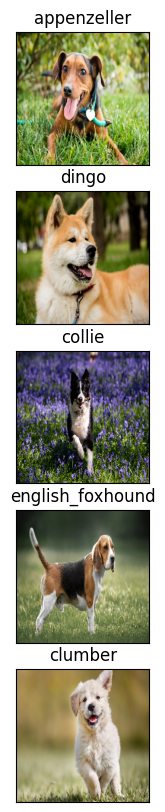

In [ ]:
plt.figure(figsize=(15, 10))
for i, image in enumerate(custom_images):
  plt.subplot(5, 1, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)